### The University of Melbourne, School of Computing and Information Systems
# COMP90086 Computer Vision, 2021 Semester 2

## Assignment 3

**Student Name:**    `Chen-An Fan`

**Student ID:**     `1087032`

This iPython notebook is a template which you should use for your Assignment 3 submission. This file should be submitted at the **Assignment 3: Code** link on the LMS, along with any images needed to run your code.

In addition to this file, you should submit a writren report explaining your results at the **Assignment 3: Report** link on the LMS. Please see the assignment specification for details on what must be included in the report for each question.

*Adding proper comments to your code is MANDATORY.*

### 1. Detect lines in the image
Use the Canny edge detector and Hough transform to detect lines in the image.

In [48]:
import cv2
import os
import matplotlib
from matplotlib import pyplot as plt
import numpy as np

'''
This fundtion load all images in folder to a list
Input: 
    rootpath (string): the path to the target folder
    color: determine what color the image should be read as.
        cv2.IMREAD_GRAYSCALE
        cv2.IMREAD_COLOR
Output:
    img_list (list): a list of images that read by openCV
'''
def load_img_to_dict(rootpath, color):
    img_dict = dict()

    for filename in os.listdir(rootpath):
        #print(filename)
        img = cv2.imread(os.path.join(rootpath, filename), color)#cv2.IMREAD_GRAYSCALE #cv2.IMREAD_COLOR
        if img is not None:
            img_dict[filename] = img
    return img_dict

# Image preprocess
'''
This function normalise the images to let them has the same max and min value.
'''
def imageNormalisation(img_dict):
    normalised_img_dict = dict()
    for filename, img in img_dict.items():
        normalised_img = cv2.normalize(img, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
        normalised_img_dict[filename] = normalised_img
    return normalised_img_dict



# canny edge detection on whole images
'''
This function call openCV Canny function to apply on a dict of image and return a dict of edge image.
Input:
    img_dict_gray (dictionary): a dictionary that cantains all input images in gray-scale
    minthreshold (double): the lower hysteresis thrshold of Canny
    maxthreshold (double): the higher hysteresis thrshold of Canny
    spertureSize (int): the aperture size for the Sobel operator used in Canny detector
    L2gradient (bool):
        True means apply L2 norm to calculate the image magnitude gradient
        False means apply L1 norm to calculate the image magnitude gradient
'''
def canny_edge_det(img_dict_gray, minthreshold=50, maxthreshold=200, apertureSize=3, L2gradient=True):
    edge_image_dict = dict()
    for filename, img in img_dict_gray.items():
        edge_image = cv2.Canny(img, minthreshold, maxthreshold, apertureSize=apertureSize, L2gradient=L2gradient)
        edge_image_dict[filename] = edge_image
    return edge_image_dict



# Hough transform
'''
This function is used to apply hough transform to a dict of edge images.
Input:
    rho_resolution: the resolution of rho, unit is pixel
    angle_resolution: the resolutin of angle, unit is rad
    threshold: the min number of intersection that counts as a edge point
    minLineLength: Minimum length of line. Line segments shorter than this are rejected. <-- set to large enough to prevent short lines of texture
    maxLineGap: Maximum allowed gap between line segments to treat them as single line.
'''
def hough_transformP(edge_image_dict, rho_resolution=1, angle_resolution = np.pi/180, threshold=200, minLineLength=10, maxLineGap=300):
    lines_dict = dict()
    for filename, edge_image in edge_image_dict.items():
        lines = cv2.HoughLinesP(edge_image, rho_resolution, angle_resolution, 
            threshold=threshold, minLineLength=minLineLength, maxLineGap=maxLineGap)
        # output of HouthLinesP is two endponints of the line
        lines_dict[filename] = lines
    return lines_dict


'''
This function is used to filter out the too vertical and too horizontal lines that has no contribution for venishing point detection.
Input:
    lines_dict (dict of np.array of np.array of np.array): a dict of lines in all images
        lines_dict.values() = [lines, lines, lines, ...]
                   = [[line,line,line,...], [line,line,line,...], [line,line,line,...], [line,line,line,...], ...]
                   = [ [ [[x1,x2,y1,y2]], [[x1,x2,y1,y2]], ...], [ [[x1,x2,y1,y2]], [[x1,x2,y1,y2]], ...], ... ]]
        lines: a image may contains multiple line
        line: a [[x1,y1,x2,y2]]
'''
def filter_out_vh(lines_dict):
    new_lines_dict = dict()
    #index_to_remove = []
    #index_to_keep = []
    for filename, lines in lines_dict.items(): #for lines in lines_list
        new_lines = [] #per image
        if lines is not None: 
            for line in lines: #for line in lines
                x1,y1,x2,y2 = line[0]
                if x1 != x2:
                    a = (y2-y1)/(x2-x1) #slope
                    if 4 > abs(a) > 0.25: #filter out the line that is too vertical or too horizontal
                        new_lines.append([x1,y1,x2,y2])
                    
        new_lines_dict[filename]=new_lines
    return new_lines_dict


'''
This function is used to plot the detected edges by canny and the line found by hough transform on the original images.
'''
def draw_canny_houghlinesP(img_dict_gray, edge_image_dict, new_lines_dict):
    for filename in img_dict_gray.keys():
        fig, _ = plt.subplots(1,3)
        fig.set_figwidth(20)
        fig.set_figheight(20)
        plt.subplot(1,3,1)
        plt.imshow(img_dict_gray[filename], cmap='gray')
        title = 'original ' + filename
        plt.title(title)
        plt.axis('off')

        #plot Canny
        plt.subplot(1,3,2)
        plt.imshow(edge_image_dict[filename] ,cmap='gray')  
        plt.title('Canny edge detected image')
        plt.axis('off')
        
        #plot Hough transform
        plt.subplot(1,3,3)
        lines = new_lines_dict[filename] #all lines in a specific image
        color_img = cv2.cvtColor(img_dict_gray[filename], cv2.COLOR_GRAY2RGB) #allow the line to be plot as red
        if lines !=[]: # some image may not have any lines detected.
            for line in lines:
                x1,y1,x2,y2 = line
                cv2.line(color_img,(x1,y1),(x2,y2),(255,0,0),3) #plot the line as red
        plt.imshow(color_img)
        plt.axis('off')
        plt.title('Hough transform detected image')

        plt.show()
        
        
    

### 2. Locate the vanishing point
Use RANSAC to locate the vanishing point from the detected lines.

#### 2.1 RANSAC functions
Define two fuctions required by RANSAC: a function to find the point where lines intersect, and a function to compute the distance from a point to a line.

In [49]:
import math
# Find the intersection point
'''
Input:
    the slope and intersection of two lines
Output:
    the intersection point coordiantes of the two input line
The line is represent as y = a*x + b
'''
def find_intersection_point(a1,b1,a2,b2):
    if a1 != a2:
        x = (b2-b1) / (a1-a2)
        y = (a1*b2 - b1*a2) / (a1-a2)
        return (x,y)

    if a1 == a2: #two line parallel, no intersection point
        return None

# Find the distance from a point to a line
'''
Input:
    a: the slope of the line
    b: the y intercept of the line
    x_p: the x coordinate of the point
    y_p: the y coordinate of the point
y = a*x + b --> a*x + (-1)*y + b = 0
'''
def find_dist_to_line(a,b,x_p,y_p):
    dist = abs(a*x_p - y_p + b)/math.sqrt(a**2 + 1)
    return dist


'''
This function get the a and b of a line by two points.
The line is preprocess, so its won't have infinite slope
'''
def get_line_ab(line):
    assert(len(line)==4)
    x1, y1, x2, y2 = line
    
    a = (y1-y2)/(x1-x2)
    b = (y2*x1 - y1*x2) / (x1-x2)
    return a,b
'''
This function is used for evaluation. It take the predicted vanishing points of all the images
and the csv file that contains the ground truth vanishing point of all the images as input.
It will output the mean sequared Euclidean distance and a dictionary that contains detailed evaluation of every image.
'''
def evaluation(pred_point_dict, gt_filename='vanishing_points.csv'):
    eval_dict = dict()
    from pandas import read_csv
    gt_df = read_csv(gt_filename) #ground truth dataframe
    gt_dict = dict()
    for gt_value in gt_df.values:
        gt_dict[gt_value[0]] = (gt_value[1],gt_value[2])
    
    msed = 0 #mean square Euclidean distance
    for filename in pred_point_dict.keys():
        gt_point = gt_dict[filename]
        pred_point = pred_point_dict[filename]
        sed = (gt_point[0]-pred_point[0])**2 + (gt_point[1]-pred_point[1])**2 #square Euclidean distance
        eval_dict[filename] = dict()
        eval_dict[filename]['gt_vanish_point'] = gt_point
        eval_dict[filename]['predicted_vanish_point'] = pred_point
        eval_dict[filename]['SED'] = sed

        print(filename)
        print("Ground truth vanish point is {}".format(gt_point))
        print("Predicted vanish point is {}".format(pred_point))
        print("Squared Euclidean distance is {}".format(sed))
        print('------------------------------------------------')
        msed += sed
    msed = msed / len(pred_point_dict)
    return msed, eval_dict

'''
This function is used to plot the prediction result of a specific iteration of RANSAC model.
It will plot the 2 sampled lines as green, the inliers line as blue and the other lines as red (pink).
'''
def plot_RANSAC_iteration(a1, b1, a2, b2, inliers_a, inliers_b, img, lines, it, filename):
    #plot all the Hough transform detected lines as red
    color_img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) #allow the line to be plot as red
    if lines !=[]: # some image may not have any lines detected.
        for line in lines:
            x1,y1,x2,y2 = line
            cv2.line(color_img,(x1,y1),(x2,y2),(255,0,0),3) #plot the line as red
    plt.imshow(color_img, alpha = 0.5)
    
    #plot the sampled line as blue
    plotLineByAB(a1, b1, img, 'b-')
    plotLineByAB(a2, b2, img, 'b-')
    
    #plot the inliner line as green
    for i in range(len(inliers_a)):
        plotLineByAB(inliers_a[i], inliers_b[i], img, 'g-')

    plt.xlim([0, img.shape[1]])
    plt.ylim([img.shape[0], 0]) #y axis is reversed due to imshow put the origin at top left corner
    
    plt.axis('off')
    plt.title(filename+' Iteration '+str(it))

    plt.show()

'''
This function is used to plot the final predicted vanishing point on the original images.
Input:
    model_x (float): the x coordinate of the predicted vanishing point
    model_y (float): the y coordinate of the predicted vanishing point
    filename (str): the file name of the image
    lines: the Hough transform detected lines of that "filename" image
    img: the original image of that "filename"
'''
def plotFinalPrediction(model_x, model_y, filename, lines, img):
    color_img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) #allow the line to be plot as red
    if lines !=[]: # some image may not have any lines detected.
        for line in lines:
            x1,y1,x2,y2 = line
            #img_color_rgb = cv2.cvtColor(img_list_color[i], cv2.COLOR_BGR2RGB)
            cv2.line(color_img,(x1,y1),(x2,y2),(255,0,0),3) #plot the line as red
    plt.imshow(color_img, alpha = 0.5)
    plt.plot(model_x, model_y, 'bx', markersize=12)
    plt.axis('off')
    plt.title(filename + " - final prediction")
    plt.show()

'''
This function is used to plot a line by its slope and y-intercept.
Input:
    a: slope
    b: y-intercept
    type: the color and shape of the plot. For example 'b-' means blue sloid line.
'''
def plotLineByAB(a,b,img, type):
    x =  np.array([0,img.shape[1]]) #img.shape[1] is the length of image in x direction
    y = a*x + b
    plt.plot(x, y, type)
    


#### 2.2 RANSAC loop
Define the main RANSAC loop

In [50]:
'''
The main sturcture of the code is referenced the worksheet07.
This function is the main RANSAC loop.
Input:
    ransac_iterations: the max number of iterations of RANSAC for each image
    ransac_threshold: the distance threshold between the predicted vanishing point and a line.
                      Line with distance smaller than this threshold will be counted as an inlier
    rasac_ratio: the stopping criteriion. The min ratio of lines to be inliers 
'''
def ransacLoop(img_dict_gray, new_lines_dict, ransac_iterations=20, ransac_threshold=3, ransac_ratio=0.6):
    pred_point_dict = dict()
    for filename, lines in new_lines_dict.items(): #iterate all images
        img = img_dict_gray[filename]
                
        ratio = 0.
        model_x = 0.
        model_y = 0.

        for it in range(ransac_iterations):
            # random sample 2 lines in one image
            #n = 2
            if len(lines) < 2:
                print("warning: there are fewer than 2 lines in this image")
        
            np.random.shuffle(lines)
            
            #pick 2 lines as sample (n=2)
            line1 = lines[0] 
            line2 = lines[1]
            
            other_lines = lines[2:] #the rest of lines
            
            a1, b1 = get_line_ab(line1)
            a2, b2 = get_line_ab(line2)
            
            
            intersection_p = find_intersection_point(a1,b1,a2,b2)
            
            if intersection_p is None: #if no intersection point, then go to next iteration
                continue
                
            
            x_p = intersection_p[0]
            y_p = intersection_p[1]
            
            # count how many line in the other_lines that are very close to the intersection_p
            num_inliers = 0
            inliers_a = []
            inliers_b = []
            for other_line in other_lines:
                a, b = get_line_ab(other_line)
                #print(a,b,x_p,y_p)
                dist = find_dist_to_line(a,b,x_p,y_p)
                if dist <= ransac_threshold:
                    num_inliers += 1
                    inliers_a.append(a)
                    inliers_b.append(b)

            #if it%100 == 0:
            #    plot_RANSAC_iteration(a1, b1, a2, b2, inliers_a, inliers_b, img, lines, it, filename)

            # if this iteration perform better than the previous iterations
            if (num_inliers/float(len(other_lines))) > ratio:
                ratio = (num_inliers/float(len(other_lines))) #update ratio
                model_x = x_p #update the x coordinate of the predicted vanishing point
                model_y = y_p #update the y coordinate of the predicted vanishing point
                # only plot when the prediction improve
                plot_RANSAC_iteration(a1, b1, a2, b2, inliers_a, inliers_b, img, lines, it, filename)

            # early stopping criterion
            if num_inliers > float(len(other_lines))*ransac_ratio:
                print('The model is found !')
                break


        pred_point_dict[filename] = (model_x,model_y)
        plotFinalPrediction(model_x, model_y, filename, lines, img)
        print("inlier ratio = {}".format(ratio))
        print('predicted x = {}'.format(model_x))
        print('predicted x = {}'.format(model_y))
    return pred_point_dict



### 3. Main function and evaluation
Run your vanishing point detection method on a folder of images, return the (x,y) locations of the vanishing points, and evaluate the result.

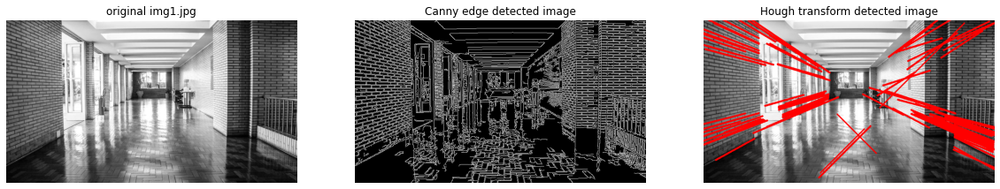

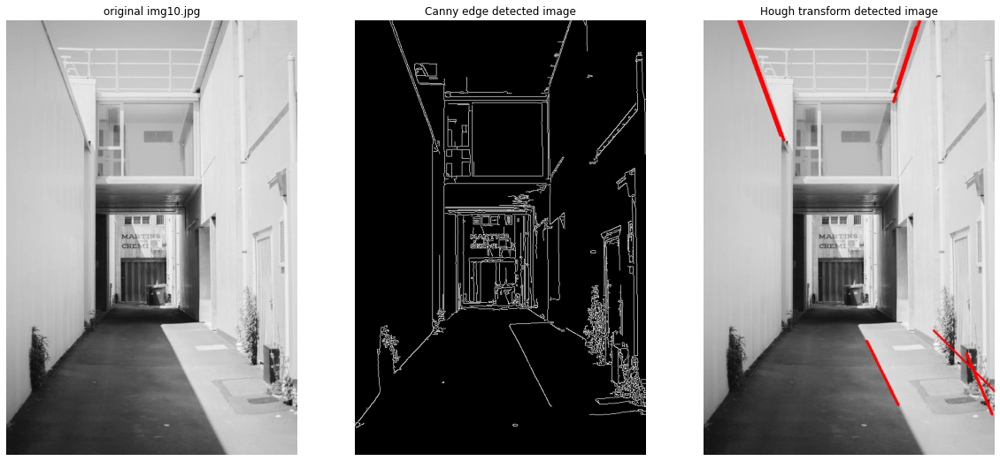

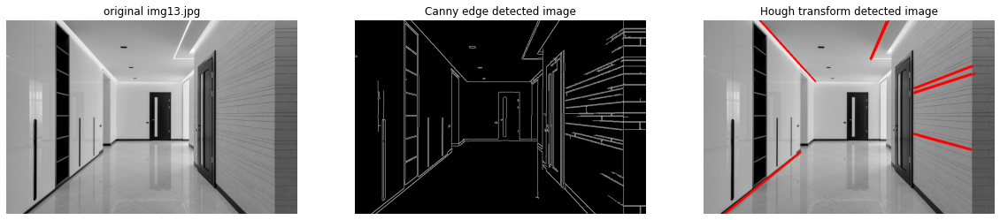

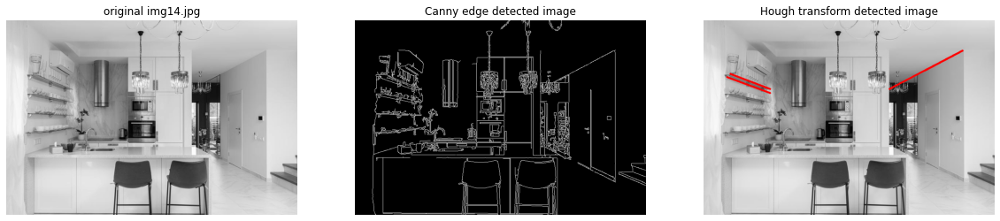

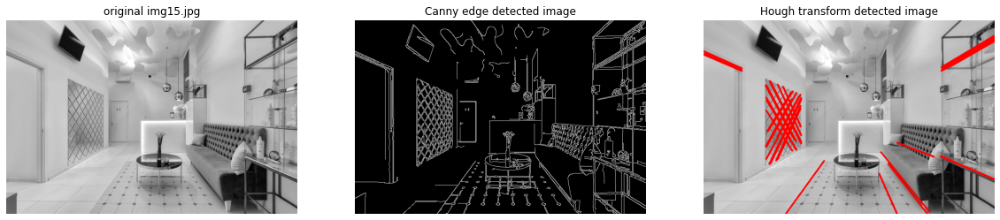

...

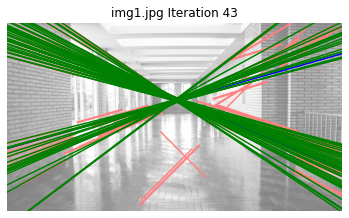

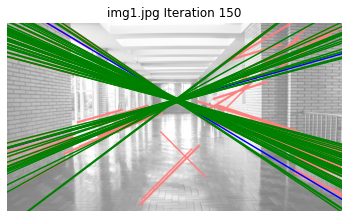

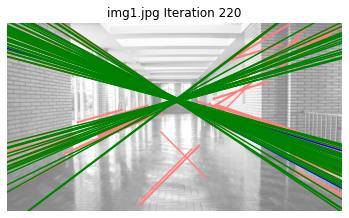

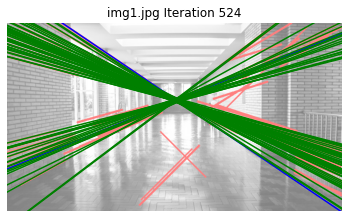

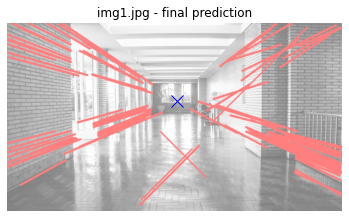

inlier ratio = 0.6382978723404256
predicted x = 404.7233782129743
predicted x = 185.01672786617706


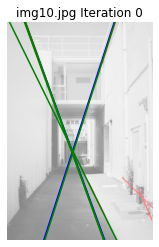

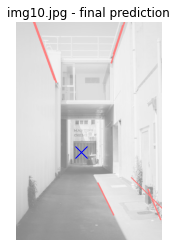

inlier ratio = 0.6666666666666666
predicted x = 239.9362741041132
predicted x = 475.43209467847396


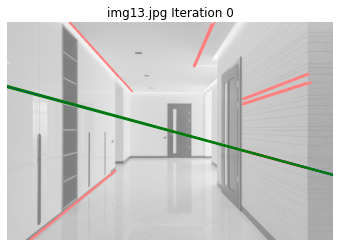

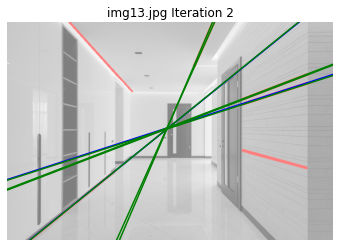

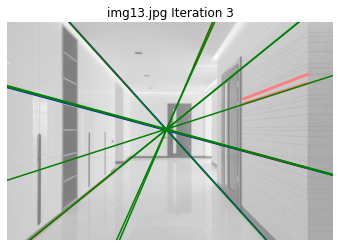

The model is found !


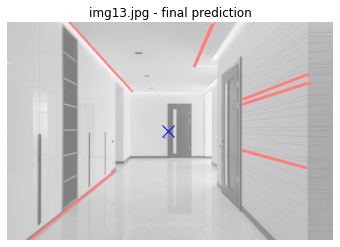

inlier ratio = 0.75
predicted x = 394.00149875104074
predicted x = 266.09969469886204


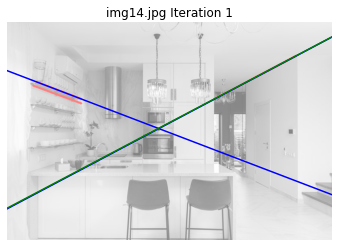

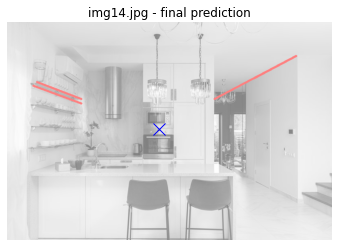

inlier ratio = 0.5
predicted x = 373.80533691687464
predicted x = 261.8529468228067


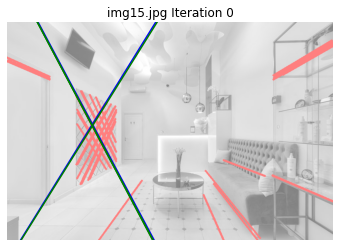

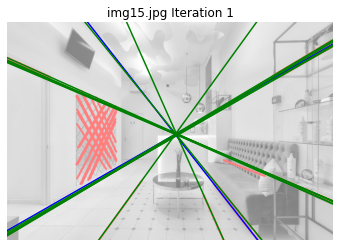

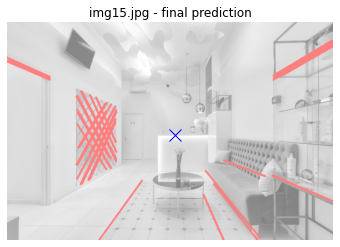

inlier ratio = 0.38235294117647056
predicted x = 412.6258957768037
predicted x = 275.16586655534684


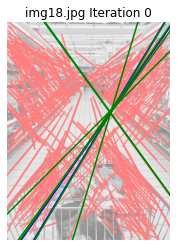

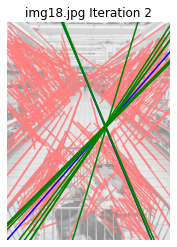

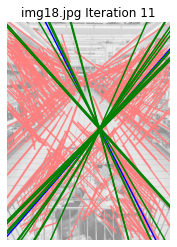

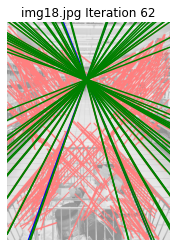

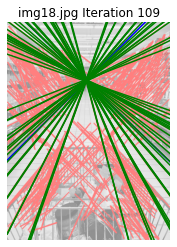

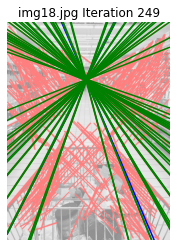

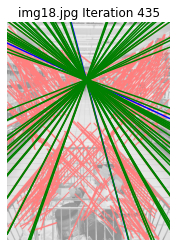

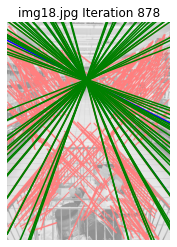

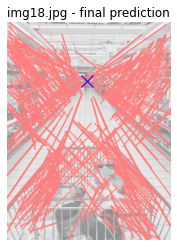

inlier ratio = 0.15915915915915915
predicted x = 293.109661728941
predicted x = 214.69953570638955


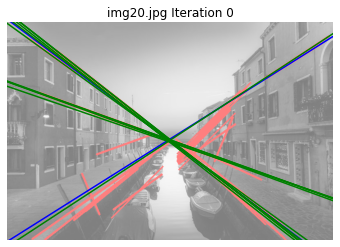

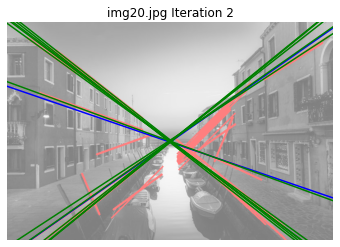

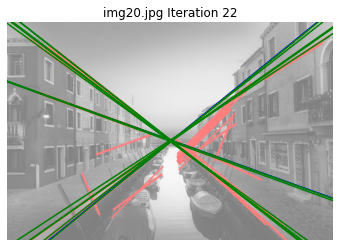

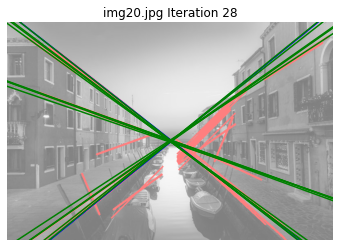

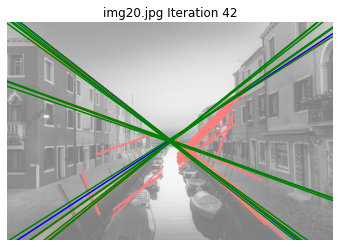

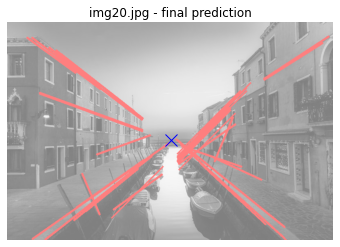

inlier ratio = 0.42857142857142855
predicted x = 400.6325839236219
predicted x = 289.02648598706503


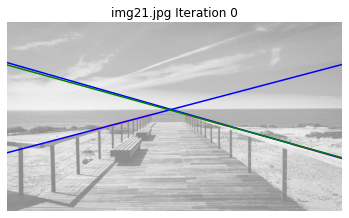

The model is found !


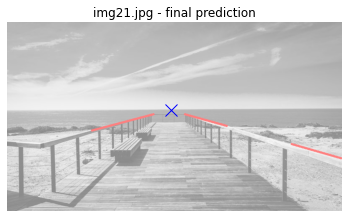

inlier ratio = 1.0
predicted x = 391.8769771528999
predicted x = 207.96485061511424


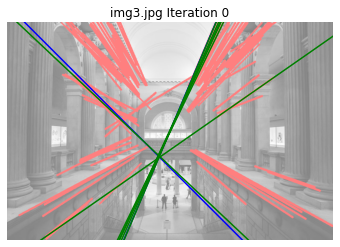

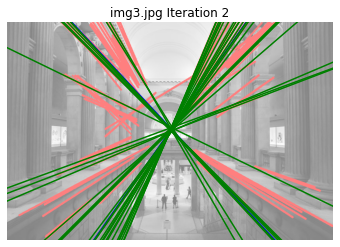

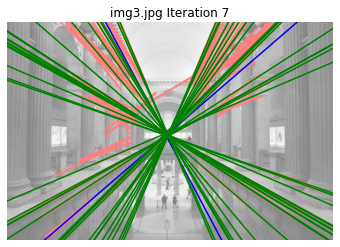

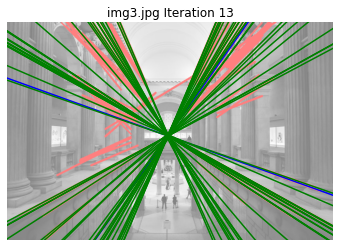

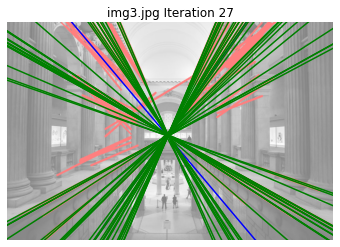

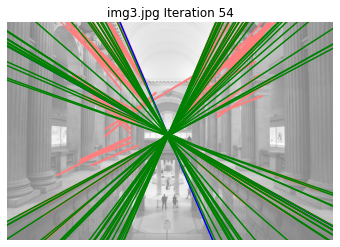

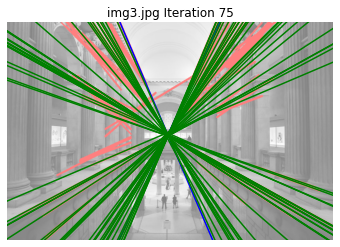

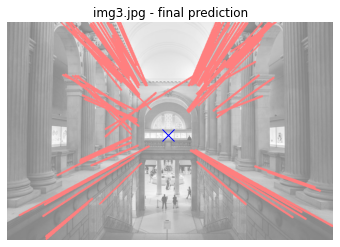

inlier ratio = 0.5531914893617021
predicted x = 394.5409662006724
predicted x = 276.04317819854896


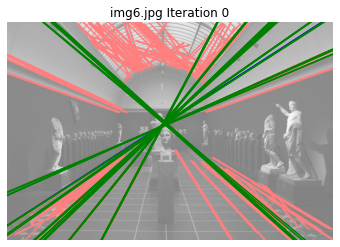

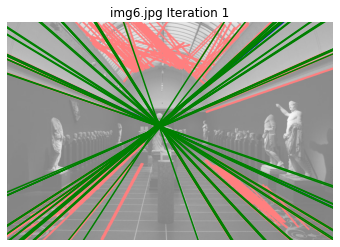

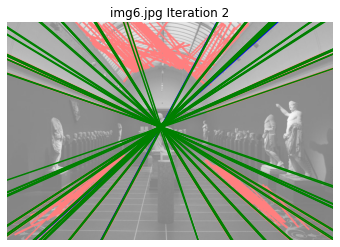

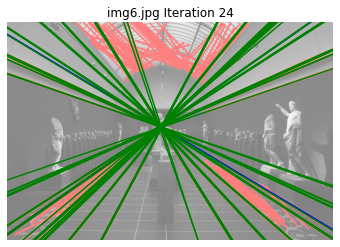

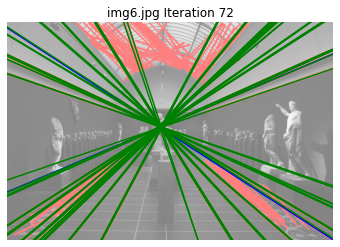

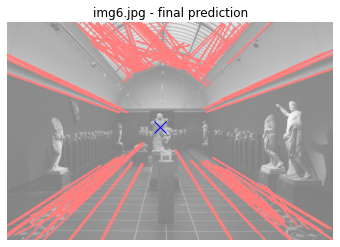

inlier ratio = 0.4108527131782946
predicted x = 375.3700648202711
predicted x = 257.6405421331762


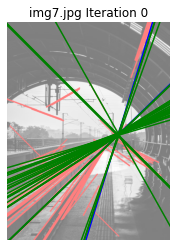

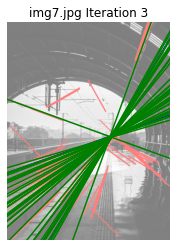

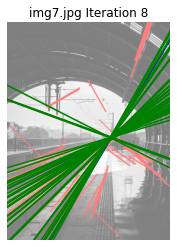

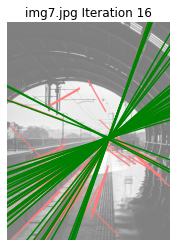

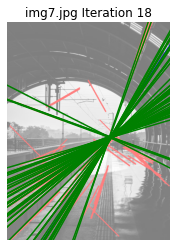

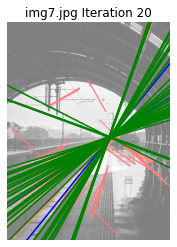

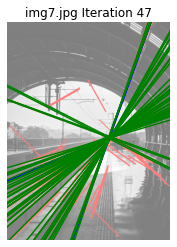

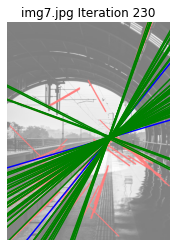

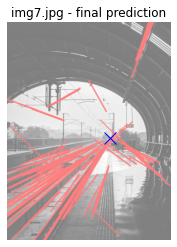

inlier ratio = 0.5979381443298969
predicted x = 377.43397431348905
predicted x = 424.5300503796211


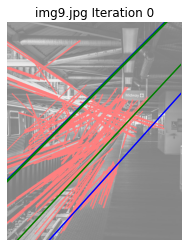

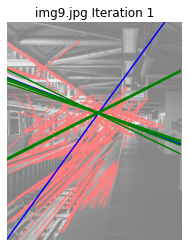

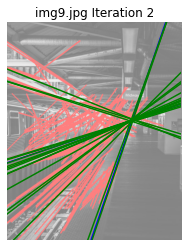

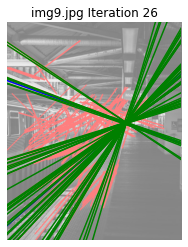

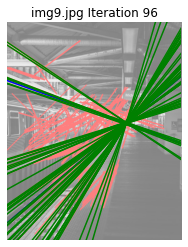

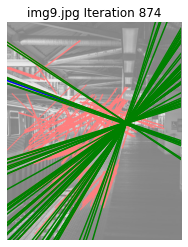

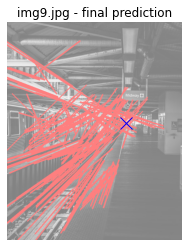

inlier ratio = 0.3248407643312102
predicted x = 435.704
predicted x = 370.29599999999994
img1.jpg
Ground truth vanish point is (404, 183)
Predicted vanish point is (404.7233782129743, 185.01672786617706)
Squared Euclidean distance is 4.590467325220979
------------------------------------------------
img10.jpg
Ground truth vanish point is (240, 466)
Predicted vanish point is (239.9362741041132, 475.43209467847396)
Squared Euclidean distance is 88.96847101350335
------------------------------------------------
img13.jpg
Ground truth vanish point is (390, 260)
Predicted vanish point is (394.00149875104074, 266.09969469886204)
Squared Euclidean distance is 53.21826767390627
------------------------------------------------
img14.jpg
Ground truth vanish point is (375, 270)
Predicted vanish point is (373.80533691687464, 261.8529468228067)
Squared Euclidean distance is 67.80169535419803
------------------------------------------------
img15.jpg
Ground truth vanish point is (416, 270)
Predicted

In [51]:
# Parameters Setting
canny_params = {
    "minthreshold": 40,
    "maxthreshold": 200,
    "apertureSize": 3,
    "L2gradient": True,
}

hough_params = {
    "rho_resolution": 1,
    "angle_resolution": np.pi/180, #1 degree
    "threshold": 50, # minVote: the min number of intersection that counts as a edge point
    "minLineLength": 100, #Minimum length of line. Line segments shorter than this are rejected. <-- set to large enough to prevent short lines of texture
    "maxLineGap": 10, #Maximum allowed gap between line segments to treat them as single line.
}

ransac_params = {
    "ransac_iterations": 1000, # number of iterations
    "ransac_threshold": 5, # distance threshold
    "ransac_ratio": 0.7 #ratio of inliers required to assert that a model fits well to data
}

# rootpath of the target image folder
rootpath = './COMP90086_asst3_2021_images/'

# ground truth vanishing points csv file
gt_van_point_csv = 'vanishing_points.csv'

'''
This is the main function to run tha whole vanishing point detection!
'''
def vanish_point_detect(rootpath, canny_params, hough_params, ransac_params, gt_van_point_csv):
    #load images as gray scale
    img_dict_gray = load_img_to_dict(rootpath, cv2.IMREAD_GRAYSCALE)
    #normalise the images
    img_dict_gray = imageNormalisation(img_dict_gray)
    # Canny edge detection on all images in the rootpath
    edge_image_dict = canny_edge_det(img_dict_gray, **canny_params)
    
    # Hough transform
    lines_dict = hough_transformP(edge_image_dict, **hough_params)
    # Filter out vertical and horizontal lines_list
    new_lines_dict = filter_out_vh(lines_dict)

    # Plot the canny and hough transform result
    draw_canny_houghlinesP(img_dict_gray, edge_image_dict, new_lines_dict)

    # RANSAC to iteratively find the vanishing point
    pred_point_dict = ransacLoop(img_dict_gray, new_lines_dict, **ransac_params)

    # Evaluate the vanishing point prediction perform
    msed, eval_dict = evaluation(pred_point_dict, gt_van_point_csv)
    print("Mean squared Euclidean distance of all images is: {}".format(msed))
    return (msed, eval_dict)

msed, eval_dict = vanish_point_detect(rootpath, canny_params, hough_params, ransac_params, gt_van_point_csv)

In [52]:
# display the prediction result and save the result to a csv file.
print("Mean squared Euclidean distance of the 12 images is: {}".format(msed))
display(eval_dict)

import csv
with open('evaluation.csv', 'w') as f:
    for filename in eval_dict.keys():
        f.write("{}\n".format(filename))
        for key in eval_dict[filename].keys():
            f.write(",{},{}\n".format(key, ("\""+str(eval_dict[filename][key])+"\"")))
            


Mean squared Euclidean distance of the 12 images is: 27.08463551305054


{'img1.jpg': {'gt_vanish_point': (404, 183),
  'predicted_vanish_point': (404.7233782129743, 185.01672786617706),
  'SED': 4.590467325220979},
 'img10.jpg': {'gt_vanish_point': (240, 466),
  'predicted_vanish_point': (239.9362741041132, 475.43209467847396),
  'SED': 88.96847101350335},
 'img13.jpg': {'gt_vanish_point': (390, 260),
  'predicted_vanish_point': (394.00149875104074, 266.09969469886204),
  'SED': 53.21826767390627},
 'img14.jpg': {'gt_vanish_point': (375, 270),
  'predicted_vanish_point': (373.80533691687464, 261.8529468228067),
  'SED': 67.80169535419803},
 'img15.jpg': {'gt_vanish_point': (416, 270),
  'predicted_vanish_point': (412.6258957768037, 275.16586655534684),
  'SED': 38.0707565766421},
 'img18.jpg': {'gt_vanish_point': (292, 213),
  'predicted_vanish_point': (293.109661728941, 214.69953570638955),
  'SED': 4.11977076996932},
 'img20.jpg': {'gt_vanish_point': (406, 288),
  'predicted_vanish_point': (400.6325839236219, 289.02648598706503),
  'SED': 29.862828818603